<a href="https://colab.research.google.com/github/IgorZhiltsoff/ippi228/blob/main/ippi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Идеи:


1.   Сопоставление с образцом (мера близости поэлементна. идеальное совпадение: 68%) ДЛЯ НОРМАЛЬНОГО. Оригинальная картинка локально портит распределение не так сильно, как глобально
3.   Зашумить + сравнить с исходным (мера близости сложна); зашумлять постепенно и сравнивать с рандомным шумом
4.   структурированные преобразования --- переворот, отражение, **ВИХРЬ**...
4.   Однородность (мера близости сложна)
5.   постоянство в мелких квадратах (непрерывность; дисперсия в малых квадратах)
6.   картинка -> звук
7.   постоянство вдоль случайного блуждания
8.   найти фильтр шума и сравнить расшумлённое изображение с исходным
10.  рассчитать плотность цвета по мелким квадратам;
10.  самоподобие


In [46]:
import numpy as np
from skimage.io import imread
import skimage
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import numpy.linalg as la
import numpy.random as rd

# **Примеры**

In [15]:
brains = imread('/content/drive/MyDrive/ippi/brain.png', as_gray=True)
x, y = brains.shape
halfx = x // 2
halfy = y // 2
br1 = brains[:halfx,:halfy]
br2 = brains[:halfx,halfy:]
br3 = brains[halfx:,:halfy]
br4 = brains[halfx:,halfy:]
brain = br4
brnoise = br1
brs=[br4, br3, br2, br1]

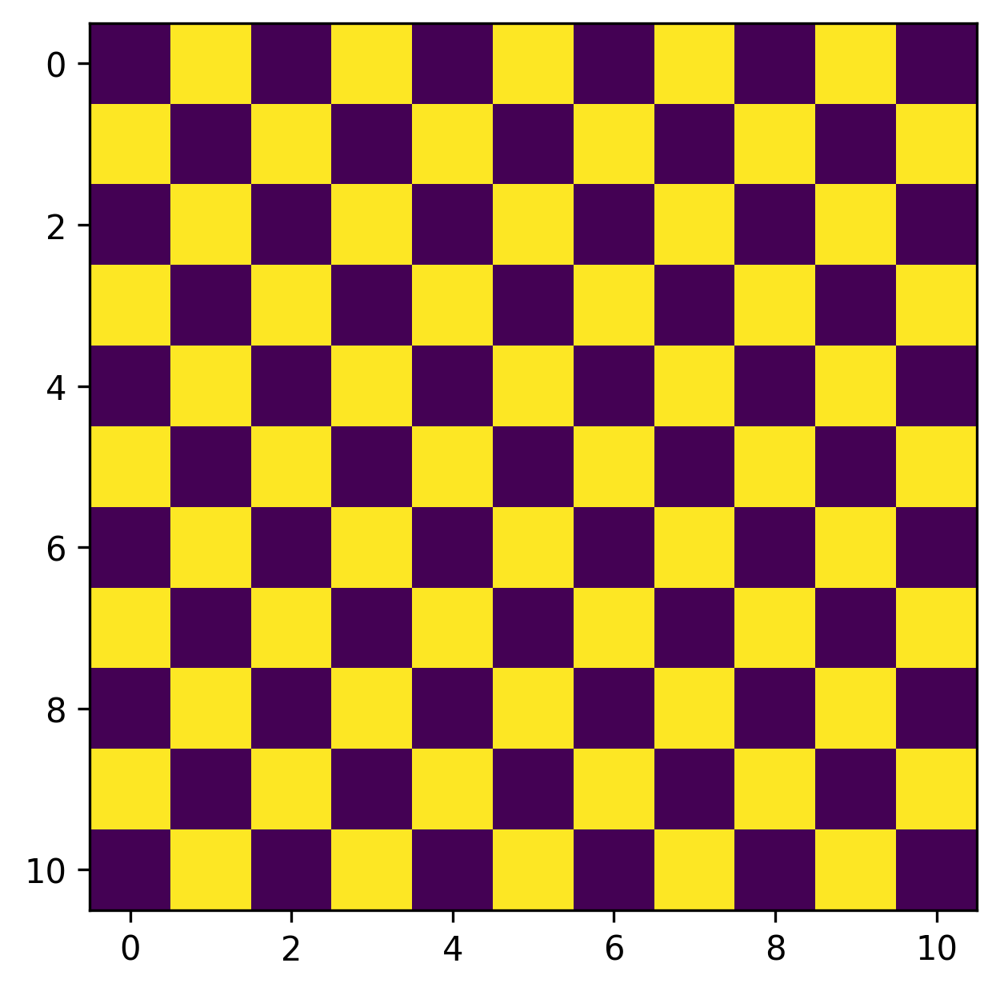

In [4]:
n=100
plt.figure(dpi=300)
plt.imshow(np.array(np.arange(121)%2).reshape(11,11))

In [207]:
def add_noise(im, N=7, mu=0.5):
  x,y = im.shape
  fl = im.ravel()
  s = fl.size

  noises = rd.normal(mu, np.array([i / (N - 1) for i in range(N)]).T, size=(s, N)).T
  return (fl * noises).reshape((N,x,y))

def mk_sample(im, N=7):
  if len(im.shape) == 3:
    im = rgb2gray(im)
  ims = add_noise(im, N=N)
  fig, axx = plt.subplots(1, N, figsize=(15,15), dpi=300)
  ax = axx.ravel()
  for i in range(N):
    ax[i].imshow(ims[i])
  plt.show()
  return ims

In [ ]:
a = np.array([[1,2,5], [3,4,6]])
x,y=a.shape
ar = a.ravel()
l=ar.size
n=rd.normal(1, np.array([100,0,5,1]).T, size=(l,4)).T
(ar*n).reshape((4,x,y))

add_noise(a)

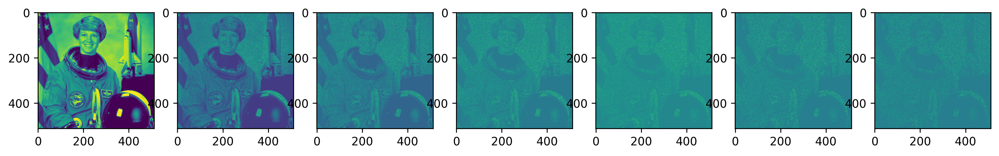

In [208]:
astro = mk_sample(skimage.data.astronaut())

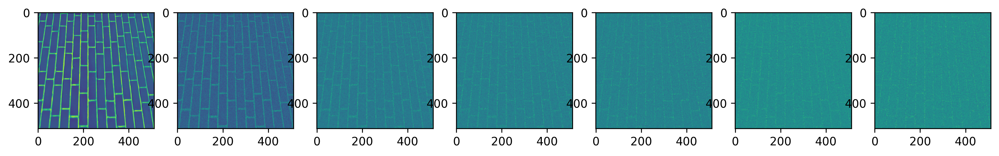

In [209]:
bricks = mk_sample(skimage.data.brick())

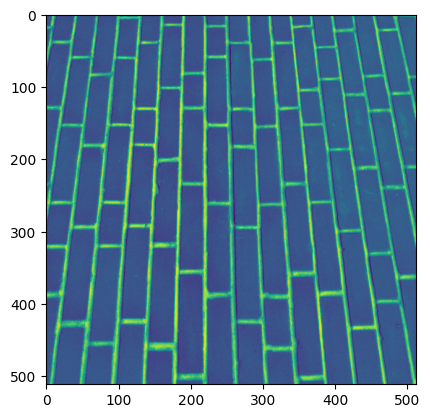

In [84]:
noise = rd.normal(0.5, 0.2, size=bricks[-2].shape)
plt.imshow(noise/2 + bricks[-2]/2)

# Близость

In [ ]:
def GlobalDist(a, b):
  return np.linalg.norm(a-b)

def LGD(a, b, N=100):
  '''Locally global distance: breaks up images into N=100 small
  local pieces and compares them as globally as possible'''
  pass

vals=[]
for im in [br4, br3, br2, br1]:
  x1=150
  y1=340
  x2=x1
  y2=y2
  x3=x1+5
  y3=y1+5
  d=30
  print(
      GlobalDist(im[x1:x1+d, y1:y1+d], im[x1:x1+d, y1:y1+d]),
      GlobalDist(im[x2:x2+d, y2:y2+d], im[x3:x3+d, y3:y3+d])
  )

#fig, ax = plt.subplots(4,2, figsize=(15, 10),dpi=300)
#for i in range(4):
#  for j in range(2):
#    ax[i][j].hist(vals[i][j])

0.0 14.526546779003203
0.0 7.997508262471787
0.0 9.603483604774581
0.0 7.925496017306319


In [ ]:
def GlobalDist(a,)

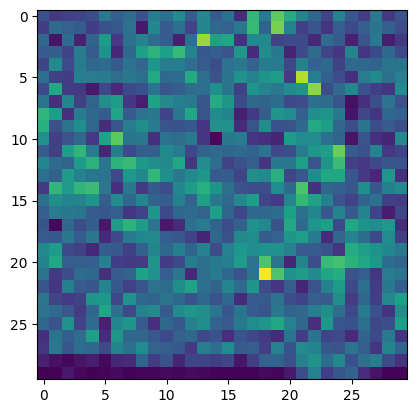

In [ ]:
plt.imshow(br3[x1:x1+d, y1:y1+d])

# Шум

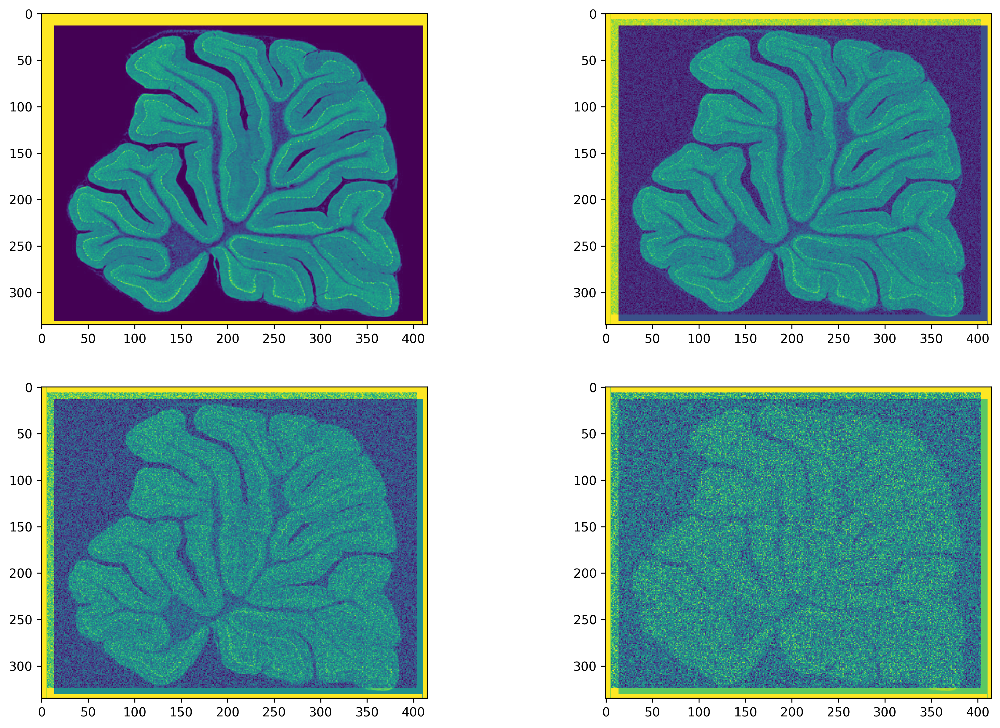

In [14]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10),dpi=300)
for i in range(2):
  for j in range(2):
    noisiness = j / 4 + i / 2
    axes[i][j].imshow(brain * (1 - noisiness) + brnoise * noisiness)

# Преобразования

In [6]:
def whirlwind(a, x, y, N):
  pass


def crop(a, D=10):
  n,m = a.shape
  nD = n // D
  mD = m // D
  return a[nD:(D-1)*nD, mD:(D-1)*mD]

def croppedx4(a, D=10):
  a = crop(a, D)
  h=np.hstack((a,a))
  return np.vstack((h,h))

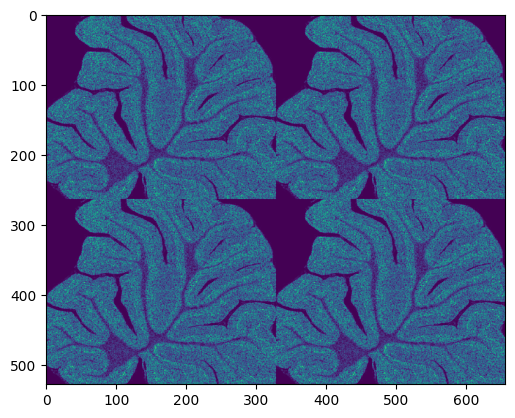

In [ ]:
plt.imshow(croppedx4(br3))

In [ ]:
len([x for line in np.abs(brain - brnoise) for x in line  if x < 0.2])/(len(brain.ravel()))

0.43543966912425824

#

# Сопоставление с образцом

In [38]:
brain.mean(), br2.mean(), f(f(br3)).mean(), brnoise.mean()

(0.3660775639872925,
 0.5000287294921565,
 0.3454558532638015,
 0.5428253488052296)

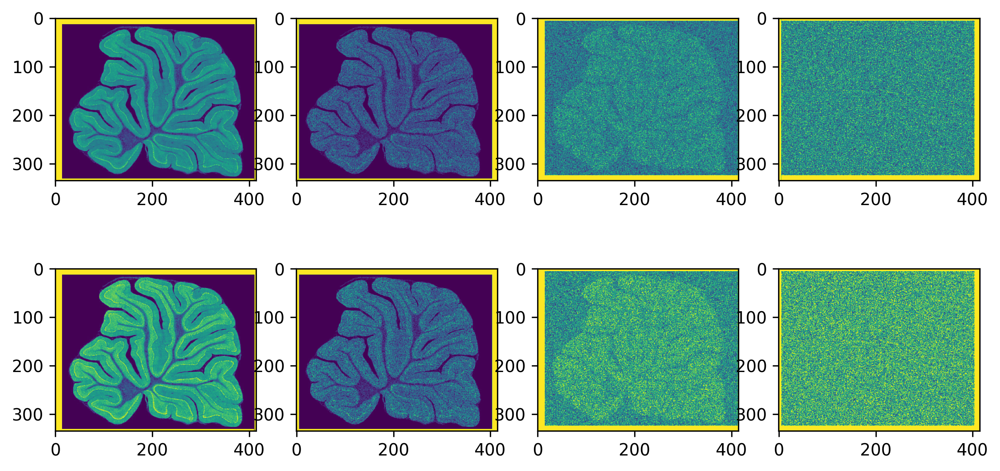

In [42]:
def f(im, delta=0.1):
  lim = 1 - delta
  im[im > lim] = 1
  im[im <= lim] += delta
  return im

fig, ax = plt.subplots(2, 4, figsize=(10,5), dpi=300)

for i in range(2):
  for j in range(4):
    fun = (lambda x: x) if i == 0 else f
    ax[i][j].imshow(fun(fun(brs[j])))


In [43]:
def within_sqrt2_sigmas(diff, sigma):
  sigma *= np.sqrt(2)
  diff = diff.ravel()
  N = diff.size
  t_sigma_rule = lambda t: len([x for x in diff if np.abs(x) < t * sigma]) / N
  return np.array([t_sigma_rule(1/2), t_sigma_rule(1), t_sigma_rule(3/2)])

def mean_sigma_ratio(a, N=10):
  cropped = crop(a)
  dt = cropped.ravel()
  mu = a.mean()
  sigma = a.std()

  means = 0
  for i in range(N):
    noise = rd.normal(mu, sigma, size=cropped.shape)
    means += within_sqrt2_sigmas(cropped - noise, sigma)
  return means / N

def distance_from_normal_naive(a):
  reference_sigmas = np.array([0.38, 0.68, 0.86])
  sigmas = mean_sigma_ratio(a)
  return np.abs(reference_sigmas - sigmas).min()


for x in [br1, br2, np.modf(br3 / br3.mean())[0], br4]:
  print(distance_from_normal(f(x)))

0.0018091740576497983
0.003276746119733942
0.04068066334072429
0.03212929600886927


In [21]:
mu = 0
sigma=1
noise1 = rd.normal(mu, sigma, size=brnoise.shape)
noise2 = rd.normal(mu, sigma, size=brnoise.shape)
within_sqrt2_sigmas(noise2-noise1, sigma)

array([0.38301025, 0.68404244, 0.86721093])

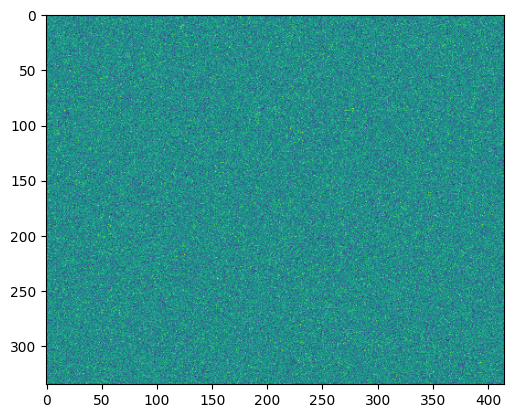

In [ ]:
plt.imshow(noise1)

# Экспериментики

In [ ]:
def apply_to_ims(fun, *ims):
  n = len(ims)
  fig, axes = plt.subplots(1, n, figsize=(15, 10),dpi=300)
  ax = axes.ravel()
  for i in range(n):
    ax[i].imshow(fun(ims[i]))

**matmul**

In [ ]:
def squarify(M,val=1):
    (a,b)=M.shape
    if a>b:
        padding=((0,0),(0,a-b))
    else:
        padding=((0,b-a),(0,0))
    return np.pad(M,padding,mode='constant',constant_values=val)

def mmmod1(a,b):
  return np.modf(np.matmul(a, b))[0]

def minus(im):
  imq = squarify(im)
  return np.modf(imq - mmmod1(imq, imq))[0]

def imimT(im):
  return mmmod1(im, im.T)

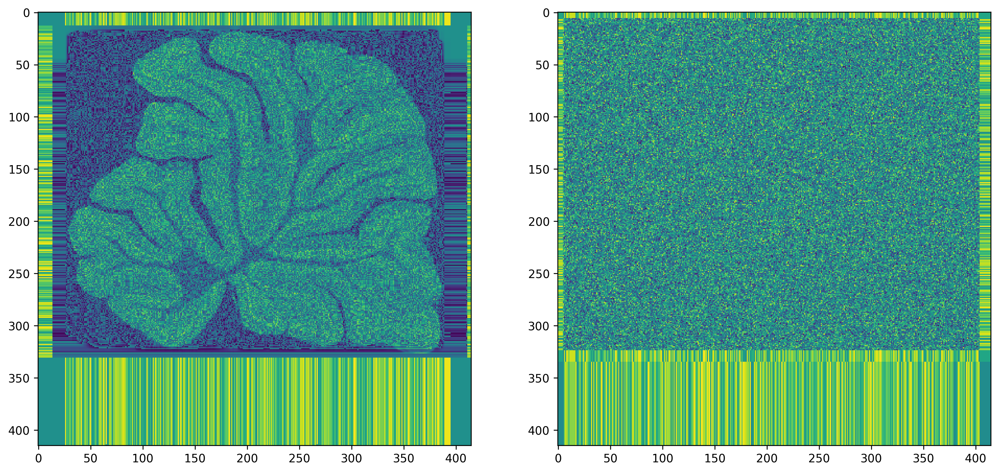

In [ ]:
apply_to_ims(minus, brain, brnoise)

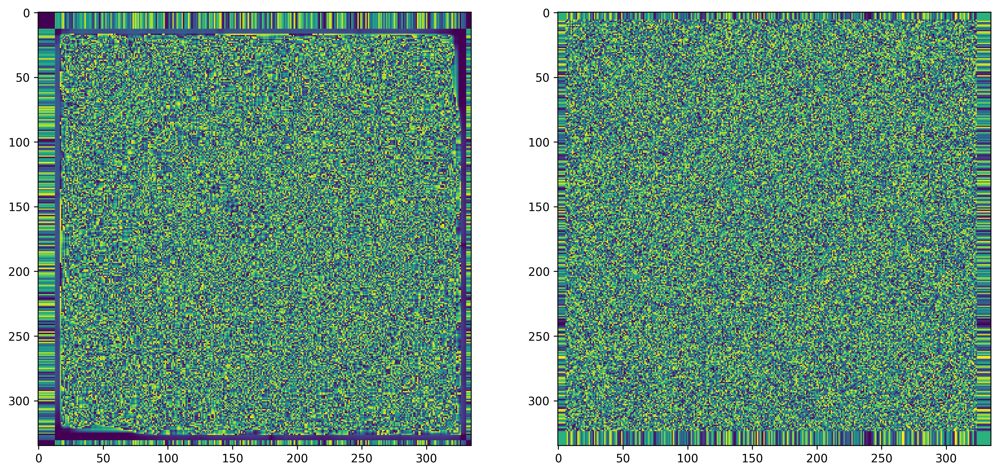

In [ ]:
apply_to_ims(imimT, brain, brnoise)

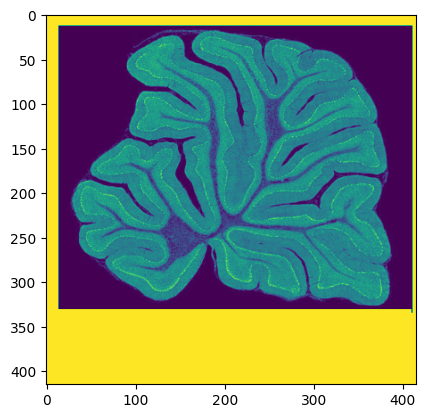

In [ ]:
brnq = squarify(brnoise)
plt.imshow(brnq)

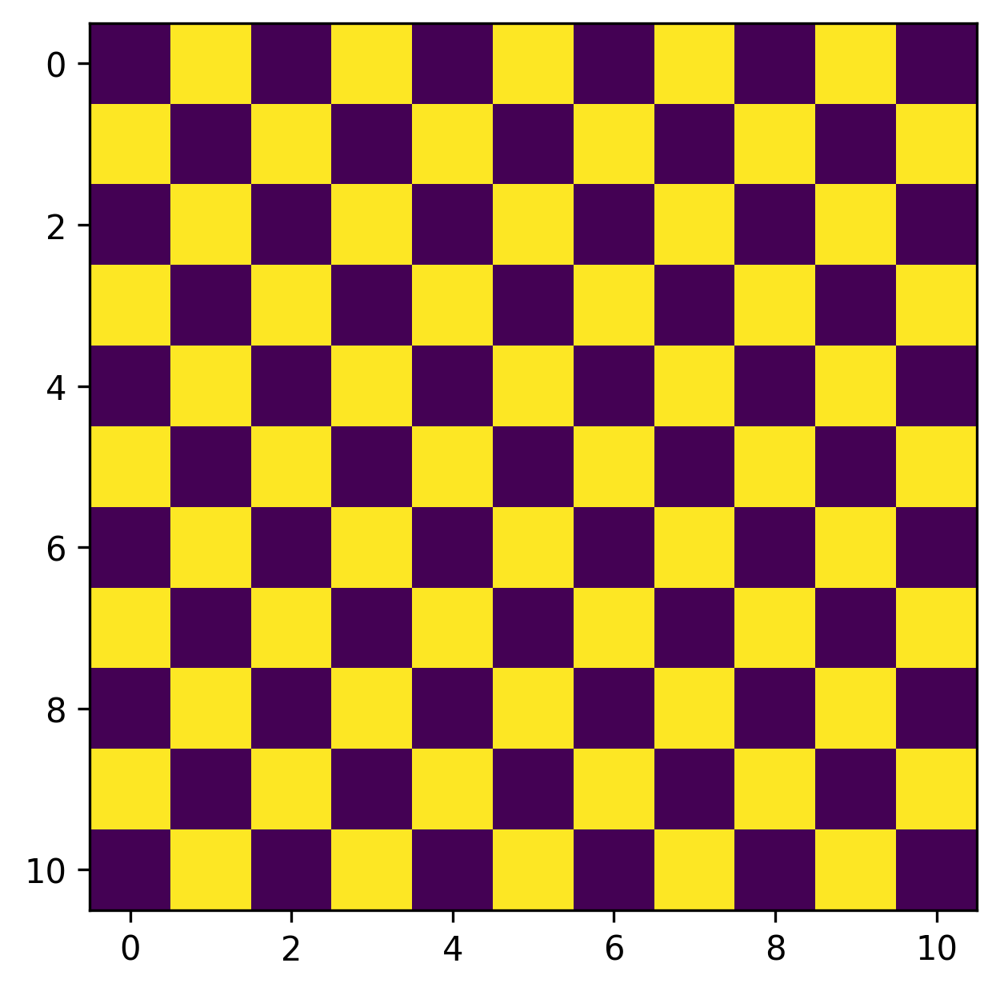

In [ ]:
n=100
plt.figure(dpi=300)
plt.imshow(np.array(np.arange(121)%2).reshape(11,11))

# **ТЕСТЫ**

**Образец**

naive

In [210]:
for x in astro:
  print(distance_from_normal_naive(x))

0.00713079104190717
0.0007942858515955775
0.008743512110726603
0.01056901191849291
0.011062211649365605
0.010316104382929514
0.010572015570934234


In [211]:
for x in bricks:
  print(distance_from_normal_naive(x))

0.005370290272971978
0.01020496924259906
0.009768238177623956
0.00974721261053424
0.008939830834294504
0.008689326220684301
0.009159698193002552


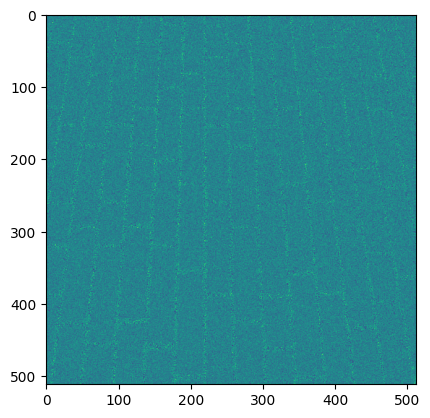

In [92]:
plt.imshow(bricks[-2])